In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
import pandas_profiling as pp

In [19]:
pima_data=pd.read_csv('./diabetes.csv')

In [8]:
pima_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [9]:
pima_data.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


In [10]:
pima_data.shape

(768, 9)

In [11]:
pima_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [12]:
pima_data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [13]:
pp.ProfileReport(pima_data)

In [14]:
pima_data.isnull().values.any()

False

In [15]:
d=pima_data[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']]=pima_data[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.nan)
d.head

<bound method NDFrame.head of      Glucose  BloodPressure  SkinThickness  Insulin   BMI
0      148.0           72.0           35.0      NaN  33.6
1       85.0           66.0           29.0      NaN  26.6
2      183.0           64.0            NaN      NaN  23.3
3       89.0           66.0           23.0     94.0  28.1
4      137.0           40.0           35.0    168.0  43.1
..       ...            ...            ...      ...   ...
763    101.0           76.0           48.0    180.0  32.9
764    122.0           70.0           27.0      NaN  36.8
765    121.0           72.0           23.0    112.0  26.2
766    126.0           60.0            NaN      NaN  30.1
767     93.0           70.0           31.0      NaN  30.4

[768 rows x 5 columns]>

In [16]:
d.isnull().sum()[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']]

Glucose            5
BloodPressure     35
SkinThickness    227
Insulin          374
BMI               11
dtype: int64

In [17]:
pima_data['Glucose'].fillna(pima_data['Glucose'].median(), inplace=True)
pima_data['BloodPressure'].fillna(pima_data['BloodPressure'].median(), inplace=True)
pima_data['SkinThickness'].fillna(pima_data['SkinThickness'].median(), inplace=True)
pima_data['Insulin'].fillna(pima_data['Insulin'].median(), inplace=True)
pima_data['BMI'].fillna(pima_data['BMI'].median(), inplace=True)
pima_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50,1
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31,0
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


In [18]:
pima_data.groupby('Outcome').size()

Outcome
0    500
1    268
dtype: int64

e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='Outcome'>

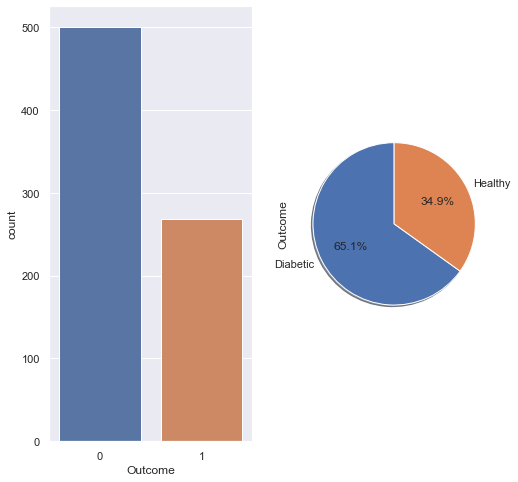

In [23]:
#countplot... Plot the freq. of outcome

fig1, ax1 = plt.subplots(1,2,figsize=(8,8))

sns.countplot(pima_data['Outcome'],ax=ax1[0])
lables = 'Diabetic', 'Healthy'
pima_data.Outcome.value_counts().plot.pie(labels=lables, autopct='%1.1f%%', shadow=True, startangle=90)

e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: Futu

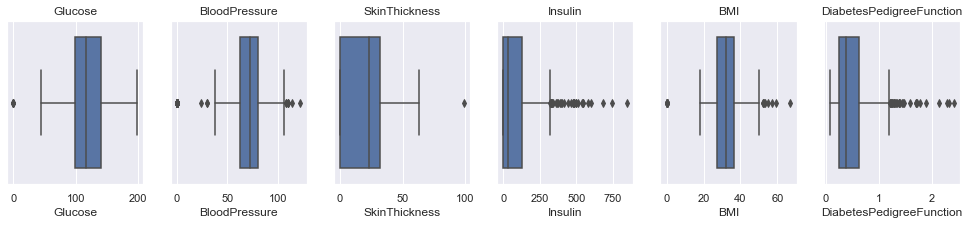

In [28]:
fig=plt.figure(figsize=(20,3))

for i in np.arange(1,7):
    data3=plt.subplot(1,7,i,title=pima_data.columns[i])
    sns.boxplot(pima_data[pima_data.columns[i]])

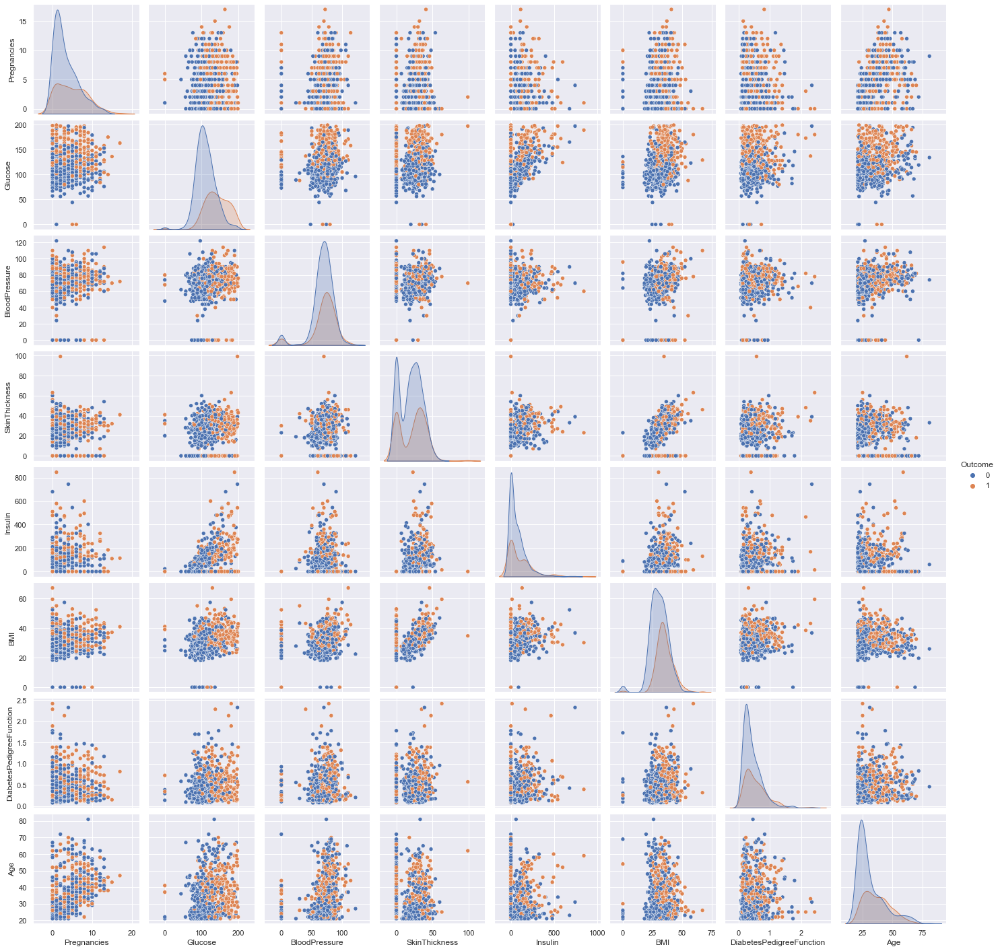

In [30]:
sns.pairplot(pima_data, hue='Outcome')

In [31]:
cor=pima_data.corr()
cor

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


<AxesSubplot:>

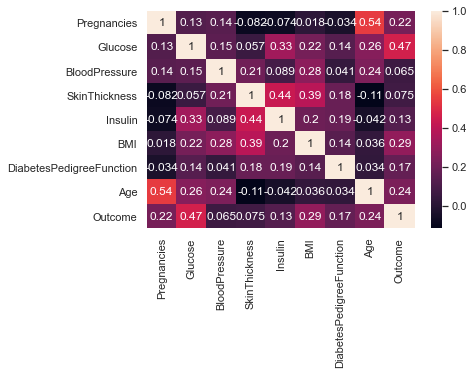

In [32]:
sns.heatmap(cor,annot=True)

In [33]:
pd.crosstab(pima_data['Pregnancies'], pima_data['Outcome'])

Outcome,0,1
Pregnancies,,
0,73,38
1,106,29
2,84,19
3,48,27
4,45,23
5,36,21
6,34,16
7,20,25
8,16,22


e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\categorical.py

<AxesSubplot:xlabel='Pregnancies', ylabel='count'>

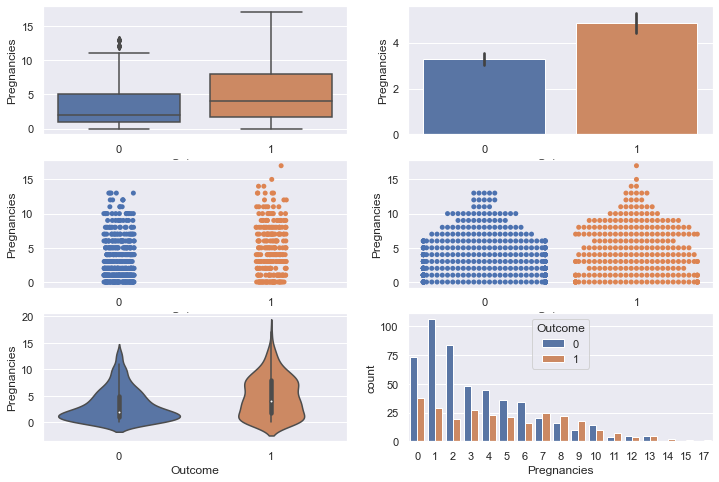

In [39]:
fig, ax2 = plt.subplots(3,2, figsize=(12,8))
sns.boxplot(x='Outcome', y='Pregnancies', data=pima_data,ax=ax2[0][0])
sns.barplot(pima_data['Outcome'], pima_data['Pregnancies'],ax=ax2[0][1])
sns.stripplot(pima_data['Outcome'], pima_data['Pregnancies'], jitter=True,ax=ax2[1][0])
sns.swarmplot(pima_data['Outcome'], pima_data['Pregnancies'], ax=ax2[1][1])
sns.violinplot(pima_data['Outcome'], pima_data['Pregnancies'], ax=ax2[2][0])
sns.countplot(x='Pregnancies', hue='Outcome', data=pima_data, ax=ax2[2][1])

e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


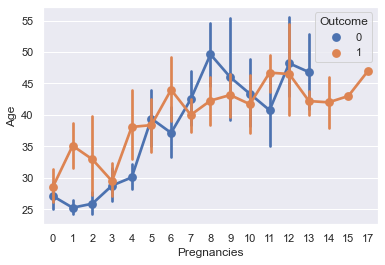

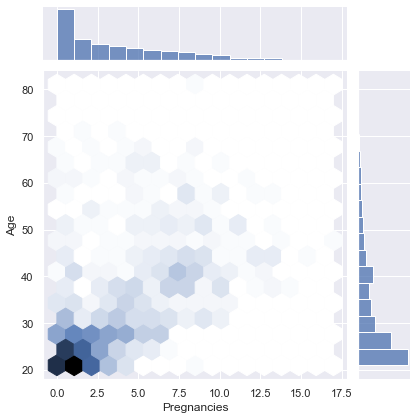

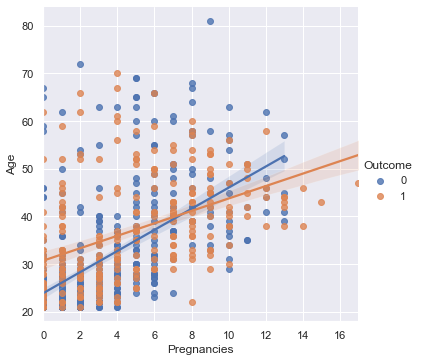

In [41]:
#lmplot---- Linear regration plot
pima_data=pd.read_csv('./diabetes.csv')

sns.pointplot(pima_data['Pregnancies'], pima_data['Age'], hue=pima_data['Outcome'])
sns.jointplot(pima_data['Pregnancies'], pima_data['Age'], kind='hex')
sns.lmplot(x='Pregnancies', y='Age', data=pima_data, hue='Outcome')

e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
e:\py set\venv\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


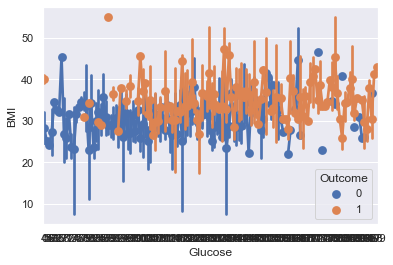

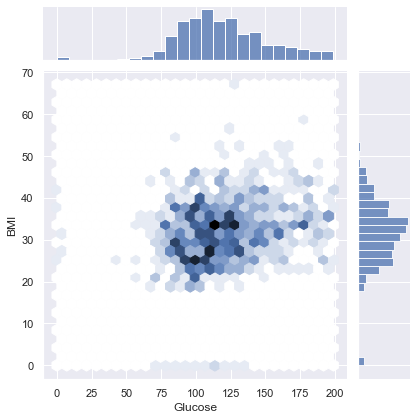

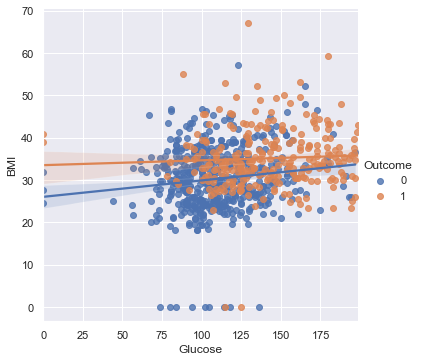

In [43]:
sns.pointplot(pima_data['Glucose'], pima_data['BMI'], hue=pima_data['Outcome'])
sns.jointplot(pima_data['Glucose'], pima_data['BMI'], kind='hex')
sns.lmplot(x='Glucose', y='BMI', data=pima_data, hue='Outcome')